# Homework 5

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

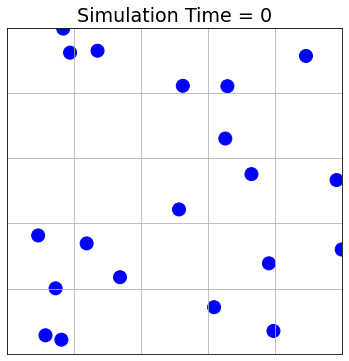

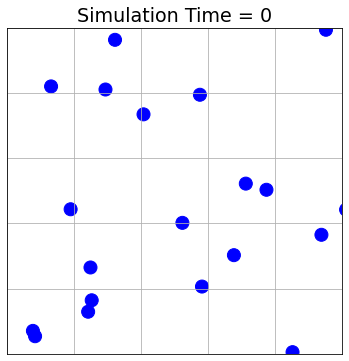

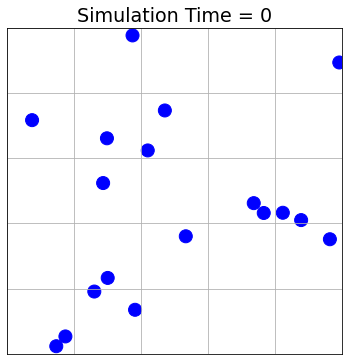

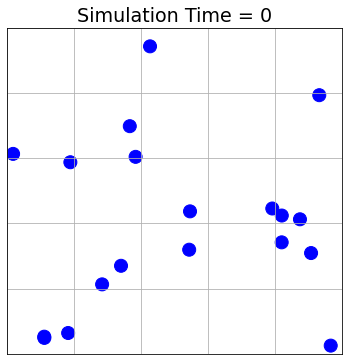

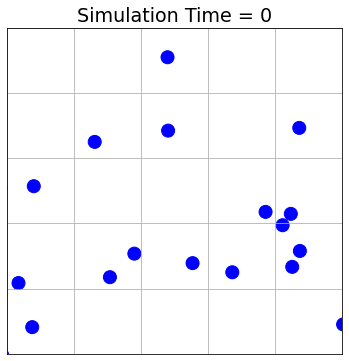

...

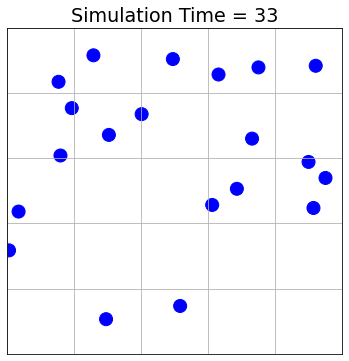

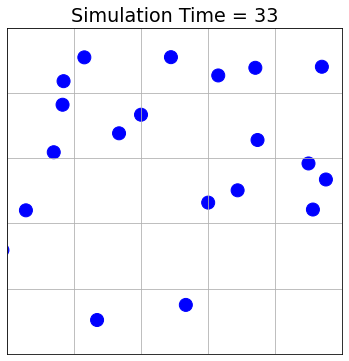

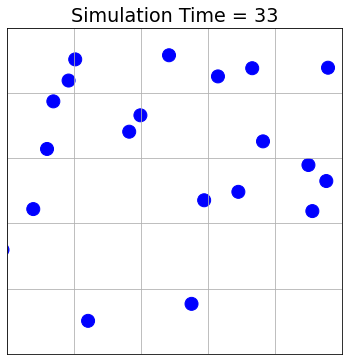

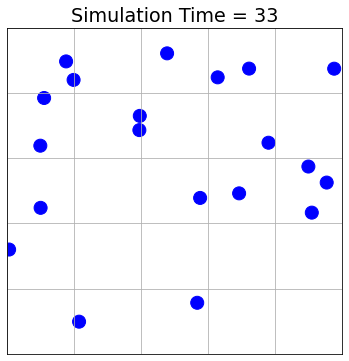

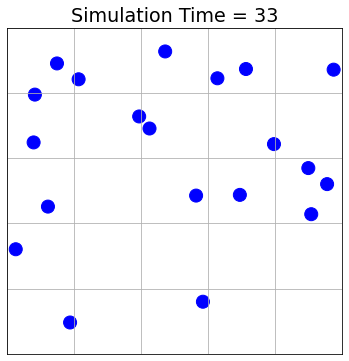

KeyboardInterrupt: 

In [227]:
# Homework 5a
#
# This program creates an animation of N particles hitting off each other according to Newtonian motion
#
# @author Scott Merkley
# @version April 10, 2022

%reset -f

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
import warnings
warnings.filterwarnings('ignore')

matplotlib.rcParams.update({'font.size': 16})



# Animation Parameters
xmin =  0.0
xmax = 10.0
ymin =  0.0
ymax = 10.0
tmin =  0.0
tmax = 100.0
vmin =  0.0
vmax =  1.0
dt   =  0.1



# Defining Particles
npart = 20

px = xmax * np.random.rand(1, npart)[0]
py = ymax * np.random.rand(1, npart)[0]
vx = 10 * np.random.randn(1, npart)[0]
vy = 10 * np.random.randn(1, npart)[0]

ax = np.array([0.0])
ay = np.array([0.0])

m  = np.ones(npart)
r  = 0.2 * np.ones(npart)   # particle radius in simulation units
rp = 65*r                   # particle radius in points(?)

colors = ['b']



# Defining Physics Functions

def magnitude(px1, py1, px2, py2):
    return ((px2 - px1)**2 + (py2 - py1)**2)**(1 / 2)

def dotProduct(v1, v2, c1, c2):
    return (v1 - v2) * (c1 - c2)

def newVelocity(px1, py1, vx1, vy1, m1, px2, py2, vx2, vy2, m2):
    mag = magnitude(px1, py1, px2, py2)**2
    vx = vx1 - (2 * m2 / (m1 + m2)) * dotProduct(vx1, vx2, px1, px2) * (px1 - px2) / mag
    vy = vy1 - (2 * m2 / (m1 + m2)) * dotProduct(vy1, vy2, py1, py2) * (py1 - py2) / mag
    return (vx, vy)


# Hit Particles need to not hit for a few frames
noCollisions = []
noCollisions.append([-1, -1, -1])


# Creating Animation Frames
    
iframe = 0

for t in np.arange(tmin,tmax,dt):

    ### output the current frame ###
    
    output_filename = '%d.png' % iframe
    
    fig = plt.figure(figsize=(6,6))

    plt.scatter(px,py,c=colors,s=rp*rp)
    
    plt.tick_params(
        axis='both',       # changes apply to both axes
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        right=False,       # ticks along the right edge are off
        left=False,        # ticks along the left edge are off
        labelbottom=False, # labels along the bottom edge are off
        labelleft=False    # labels along the left edge are off
    ) 

    plt.grid()
    plt.axis([xmin,xmax,ymin,ymax])
    plt.title('Simulation Time = '+ str(int(t)))
#     plt.savefig(output_filename,format="png")
#     plt.close(fig)
    plt.show()

    ### evolve the particle's position ###

    for i in range(0, npart):
        
        if(vx[i] > 20):
            vx[i] -= 1

        if(vy[i] > 20):
            vy[i] -= 1

        ### take a tentative step ###
        
        pxtemp = px[i] + vx[i] * dt
        pytemp = py[i] + vy[i] * dt

        # Checking if the particle hits the xmax or xmin walls
        if(pxtemp + r[i] > xmax):
            pxtemp -= r[i]
            vx[i] = - vx[i]
            
        if(pxtemp + r[i] < xmin):
            pxtemp += r[i]
            vx[i] = - vx[i]
            
        # Checking if the particle hits the ymax or ymin walls
        if(pytemp + r[i] > ymax):
            pytemp -= r[i]
            vy[i] = -vy[i]
            
        if(pytemp + r[i] < ymin):
            pytemp += r[i]
            vy[i] = -vy[i]
            
        # Check if the particle hits any of the other particles and then account for velocity
        particleHits = np.where((px[i] - px)**2 + (py[i] - py)**2 < r[i] + r)
        if(np.shape(particleHits)[1] >= 2):
            # These are the indeces of the particles hitting each other
            particle1 = particleHits[0][0]
            particle2 = particleHits[0][1]
            
            if(((np.array(noCollisions)[:, 0] == particle1) & (np.array(noCollisions)[:, 1] == particle2) & (np.array(noCollisions)[:, 2] > 0)).any()):
                np.array(noCollisions)[np.where((np.array(noCollisions)[:, 0] == particle1) & (np.array(noCollisions)[:, 1] == particle2) & (np.array(noCollisions)[:, 2] > 0))][0][2] -= 1
            
            else:
                # Changing the velocities of the colliding particles
                vx[particle1], vy[particle1] = newVelocity(pxtemp, pytemp, vx[particle1], vy[particle1], m[particle1], px[particle2], py[particle2], vx[particle2], vy[particle2], m[particle2])
                vx[particle2], vy[particle2] = newVelocity(px[particle2], py[particle2], vx[particle2], vy[particle2], m[particle2], pxtemp, pytemp, vx[particle1], vy[particle1], m[particle1])

                noCollisions.append([particle1, particle2, 3])
        
        px[i] = pxtemp
        py[i] = pytemp

    iframe = iframe+1
    
    
    
# Stitch Frames Together to Make a Movie
# os.system('rm hw05a.mp4')
# os.system('ffmpeg -i %d.png -vf scale=432x432 hw05a.mp4')
# os.system('rm *.png')

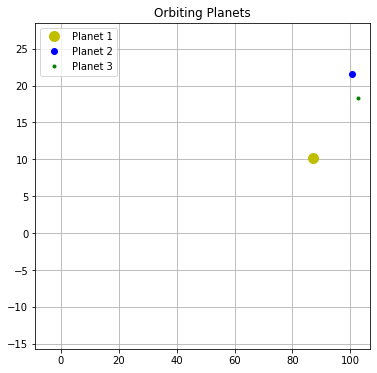

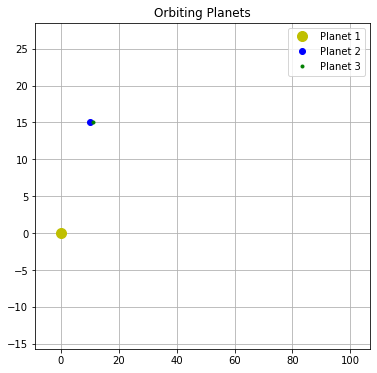

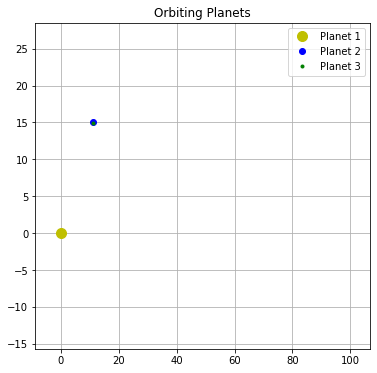

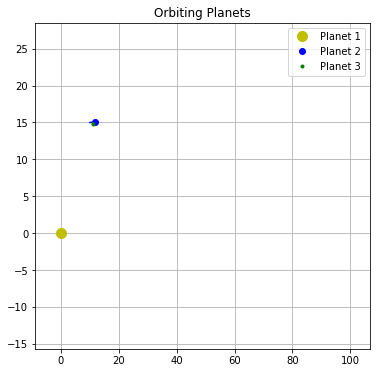

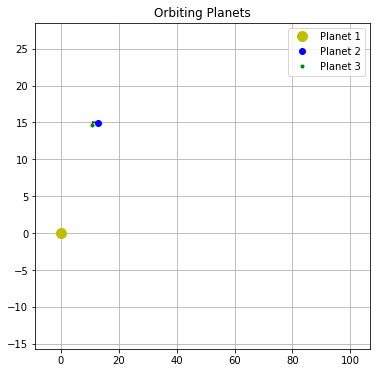

...

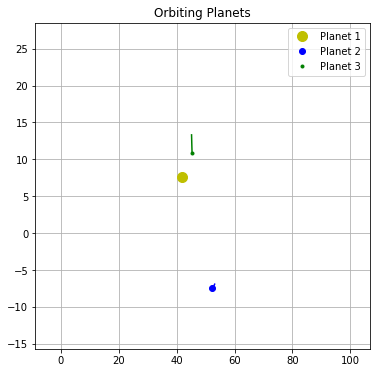

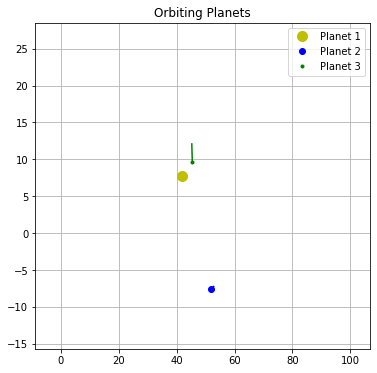

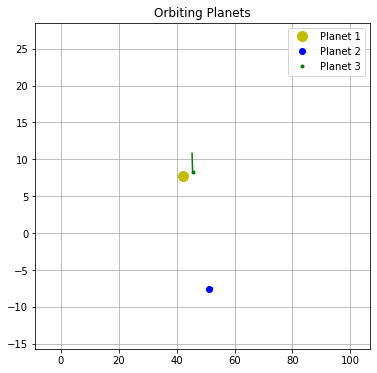

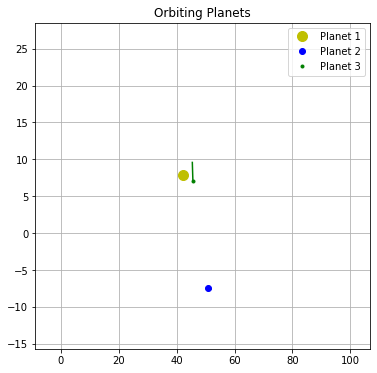

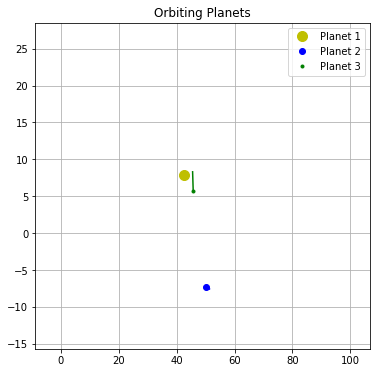

KeyboardInterrupt: 

In [147]:
# Homework 5b
#
# This program represents a three body gravitational problem and creates an animation
#
# @author Scott Merkley
# @version April 09, 2022

import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from scipy.integrate import odeint


def threeBodyMomentumDerivativeX(G, m1, m2, m3, pos1X, pos2X, pos3X, pos1Y, pos2Y, pos3Y):
    dpdt = ((-G * m1 * m2 * (2 * pos1X - 2 * pos2X)) / 2 * ((pos1X - pos2X)**2 + (pos1Y - pos2Y)**2)**(3 / 2)) - ((G * m3 * m1 * (-2 * pos3X + 2 * pos1X)) / 2 * ((pos3X - pos1X)**2 + (pos3Y - pos1Y)**2)**(3 / 2))
    return dpdt

def threeBodyMomentumDerivativeY(G, m1, m2, m3, pos1X, pos2X, pos3X, pos1Y, pos2Y, pos3Y):
    dpdt = ((-G * m1 * m2 * (2 * pos1Y - 2 * pos2Y)) / 2 * ((pos1X - pos2X)**2 + (pos1Y - pos2Y)**2)**(3 / 2)) - ((G * m3 * m1 * (-2 * pos3Y + 2 * pos1Y)) / 2 * ((pos3X - pos1X)**2 + (pos3Y - pos1Y)**2)**(3 / 2))
    return dpdt
    

def gravitationalThreeBody(y, t):
    
    G = 1
    m1 = 100
    m2 = 10
    m3 = 5
    
    # Unpack the vectors
    
    # Object 1
    qx1 = y[0]     # x position
    qy1 = y[1]     # y position
    px1 = y[2]     # x momentum
    py1 = y[3]     # y momentum
    
    # Object 2
    qx2 = y[4]     # x position
    qy2 = y[5]     # y position
    px2 = y[6]     # x momentum
    py2 = y[7]     # y momentum

    # Object 3
    qx3 = y[8]     # x position
    qy3 = y[9]     # y position
    px3 = y[10]    # x momentum
    py3 = y[11]    # y momentum

    
    # Position derivatives
    
    # X Positions
    qx1Dot = px1 / m1
    qx2Dot = px2 / m2
    qx3Dot = px3 / m3
    
    # Y Positions
    qy1Dot = py1 / m1
    qy2Dot = py2 / m2
    qy3Dot = py3 / m3
    
    # X Momenta
    px1Dot = threeBodyMomentumDerivativeX(G, m1, m2, m3, qx1, qx2, qx3, qy1, qy2, qy3)
    px2Dot = threeBodyMomentumDerivativeX(G, m2, m1, m3, qx2, qx1, qx3, qy2, qy1, qy3)
    px3Dot = threeBodyMomentumDerivativeX(G, m3, m2, m1, qx3, qx2, qx1, qy3, qy2, qy1)
    
    # Y Momenta
    py1Dot = threeBodyMomentumDerivativeY(G, m1, m2, m3, qx1, qx2, qx3, qy1, qy2, qy3)
    py2Dot = threeBodyMomentumDerivativeY(G, m2, m1, m3, qx2, qx1, qx3, qy2, qy1, qy3)
    py3Dot = threeBodyMomentumDerivativeY(G, m3, m2, m1, qx3, qx2, qx1, qy3, qy2, qy1)
    
    
    dydt = np.array([qx1Dot, qy1Dot, px1Dot, py1Dot, qx2Dot, qy2Dot, px2Dot, py2Dot, qx3Dot, qy3Dot, px3Dot, py3Dot])
    
    return dydt


# Initital y vector
pos = 15
y0 = np.array([0, 0, 0, 0, 10, pos, 100000, 10000, 11, pos, 1000, 1000])

# Time vector for the whole system
time = np.arange(0, 0.1, 0.0001)


# Solve the ODE
sol = odeint(gravitationalThreeBody, y0, time)


for i in range(len(sol)):
    
    # Output File Name
    fileName = '%d.png' % iFrame
    
    fig = plt.figure(figsize = (6, 6))
    
    lineLength = 3

    plt.axis([sol[:, 8].min() - 3, sol[:, 8].max() + 3, sol[:, 9].min() - 3, sol[:, 9].max() + 3])
    plt.title(f'Orbiting Planets')
    plt.plot(sol[i - 1, 0], sol[i - 1, 1], 'y.', label = 'Planet 1', ms = 20)
    plt.plot(sol[i - lineLength : i, 0], sol[i - lineLength : i, 1], 'y-')
    plt.plot(sol[i - 1, 4], sol[i - 1, 5], 'b.', label = 'Planet 2', ms = 12)
    plt.plot(sol[i - lineLength : i, 4], sol[i - lineLength : i, 5], 'b-')
    plt.plot(sol[i - 1, 8], sol[i - 1, 9], 'g.', label = 'Planet 3')
    plt.plot(sol[i - lineLength : i, 8], sol[i - lineLength : i, 9], 'g-')
    plt.grid()
    plt.legend()
#     plt.savefig(fileName, format = 'png')
#     plt.close(fig)
    plt.show()

    
    
# Stitch Frames Together to Make a Movie
# os.system('rm hw05b.mp4')
# os.system('ffmpeg -i %d.png -vf scale=432x432 hw05b.mp4')
# os.system('rm *.png')